In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

from pathlib import Path
from PIL import Image
from tqdm import tqdm
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

from csbdeep.utils import normalize
from stardist import random_label_cmap
from stardist.models import StarDist2D

lbl_cmap = random_label_cmap()
plt.rcParams['figure.figsize'] = (12, 8)

## 1. Load trained model

In [2]:
# Thông tin model (phải khớp với training notebook)
model_name = 'stardist_my_data_v2_improved'
model_basedir = 'models'

# Load model
print(f"Loading model: {model_name}...")
model = StarDist2D(None, name=model_name, basedir=model_basedir)

print(f"\n✅ Model loaded successfully!")
print(f"   Config: n_rays={model.config.n_rays}, grid={model.config.grid}")
print(f"   Thresholds: nms={model.thresholds.nms:.3f}, prob={model.thresholds.prob:.3f}")

Loading model: stardist_my_data_v2_improved...
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.489673, nms_thresh=0.3.

✅ Model loaded successfully!
   Config: n_rays=64, grid=(2, 2)
   Thresholds: nms=0.300, prob=0.490


## 2. Load tất cả frames

In [3]:
# Đường dẫn đến frames
frames_dir = Path('frames')
frame_files = sorted(frames_dir.glob('frame_*.png'))

print(f"Found {len(frame_files)} frames")
print(f"First frame: {frame_files[0].name}")
print(f"Last frame: {frame_files[-1].name}")

Found 886 frames
First frame: frame_0001.png
Last frame: frame_0886.png


## 3. Predict trên tất cả frames

**LƯU Ý**: Việc này có thể mất nhiều thời gian (10-30 phút tùy GPU và số lượng frames)

In [4]:
# Tạo thư mục output
output_dir = Path('predictions')
output_dir.mkdir(exist_ok=True)

# Thư mục cho masks và overlays
masks_dir = output_dir / 'masks'
overlay_dir = output_dir / 'overlays'
masks_dir.mkdir(exist_ok=True)
overlay_dir.mkdir(exist_ok=True)

print(f"Output directories:")
print(f"  Masks: {masks_dir}")
print(f"  Overlays: {overlay_dir}")

Output directories:
  Masks: predictions\masks
  Overlays: predictions\overlays


In [5]:
# Predict từng batch để tiết kiệm memory
BATCH_SIZE = 10  # Điều chỉnh tùy vào RAM/GPU của bạn

# Thông tin kết quả
results = []

print(f"\n{'='*60}")
print(f"STARTING PREDICTION ON {len(frame_files)} FRAMES")
print(f"{'='*60}\n")

for i in tqdm(range(0, len(frame_files), BATCH_SIZE), desc="Processing batches"):
    batch_files = frame_files[i:i+BATCH_SIZE]
    
    for frame_file in batch_files:
        # Load và normalize ảnh
        img = np.array(Image.open(frame_file))
        img_norm = normalize(img, 1, 99.8, axis=(0, 1))
        
        # Predict
        labels, details = model.predict_instances(
            img_norm,
            n_tiles=model._guess_n_tiles(img_norm),
            show_tile_progress=False
        )
        
        # Đếm số objects
        n_objects = len(np.unique(labels)) - 1
        
        # Lưu thông tin
        results.append({
            'frame': frame_file.name,
            'n_objects': n_objects,
            'mean_prob': details['prob'].mean() if len(details['prob']) > 0 else 0
        })
        
        # Lưu mask (16-bit để tiết kiệm dung lượng nếu < 65536 objects)
        if n_objects < 65536:
            labels_save = labels.astype(np.uint16)
        else:
            labels_save = labels.astype(np.uint32)
        
        Image.fromarray(labels_save).save(masks_dir / frame_file.name)
        
        # Tạo overlay (mỗi 10 frame để tiết kiệm dung lượng)
        frame_num = int(frame_file.stem.split('_')[1])
        if frame_num % 10 == 0:
            fig, ax = plt.subplots(1, 1, figsize=(10, 10))
            ax.imshow(img, cmap='gray' if img.ndim == 2 else None)
            ax.imshow(labels, cmap=lbl_cmap, alpha=0.5)
            ax.set_title(f"{frame_file.name} - {n_objects} objects")
            ax.axis('off')
            plt.tight_layout()
            plt.savefig(overlay_dir / frame_file.name, dpi=100, bbox_inches='tight')
            plt.close()

print(f"\n{'='*60}")
print("✅ PREDICTION COMPLETED!")
print(f"{'='*60}")


STARTING PREDICTION ON 886 FRAMES



Processing batches: 100%|██████████| 89/89 [12:43<00:00,  8.58s/it]


✅ PREDICTION COMPLETED!


## 4. Phân tích kết quả

In [6]:
# Tạo DataFrame
df = pd.DataFrame(results)
df['frame_num'] = df['frame'].apply(lambda x: int(x.split('_')[1].split('.')[0]))
df = df.sort_values('frame_num')

# Lưu kết quả
df.to_csv(output_dir / 'detection_results.csv', index=False)
print(f"✅ Results saved to: {output_dir / 'detection_results.csv'}")

# Thống kê
print(f"\n{'='*60}")
print("DETECTION STATISTICS")
print(f"{'='*60}")
print(f"\nTotal frames: {len(df)}")
print(f"Total objects detected: {df['n_objects'].sum()}")
print(f"\nObjects per frame:")
print(f"  Mean: {df['n_objects'].mean():.1f}")
print(f"  Median: {df['n_objects'].median():.1f}")
print(f"  Std: {df['n_objects'].std():.1f}")
print(f"  Min: {df['n_objects'].min()}")
print(f"  Max: {df['n_objects'].max()}")
print(f"\nMean detection probability: {df['mean_prob'].mean():.3f}")

# Top 10 frames có nhiều objects nhất
print(f"\nTop 10 frames with most objects:")
print(df.nlargest(10, 'n_objects')[['frame', 'n_objects', 'mean_prob']].to_string(index=False))

✅ Results saved to: predictions\detection_results.csv

DETECTION STATISTICS

Total frames: 886
Total objects detected: 113009

Objects per frame:
  Mean: 127.5
  Median: 128.0
  Std: 15.0
  Min: 85
  Max: 166

Mean detection probability: 0.795

Top 10 frames with most objects:
         frame  n_objects  mean_prob
frame_0399.png        166   0.781235
frame_0764.png        165   0.800803
frame_0762.png        164   0.794119
frame_0410.png        163   0.787222
frame_0777.png        163   0.805421
frame_0157.png        162   0.798077
frame_0637.png        162   0.786194
frame_0776.png        162   0.805180
frame_0763.png        161   0.808678
frame_0767.png        161   0.798980


## 5. Visualize kết quả

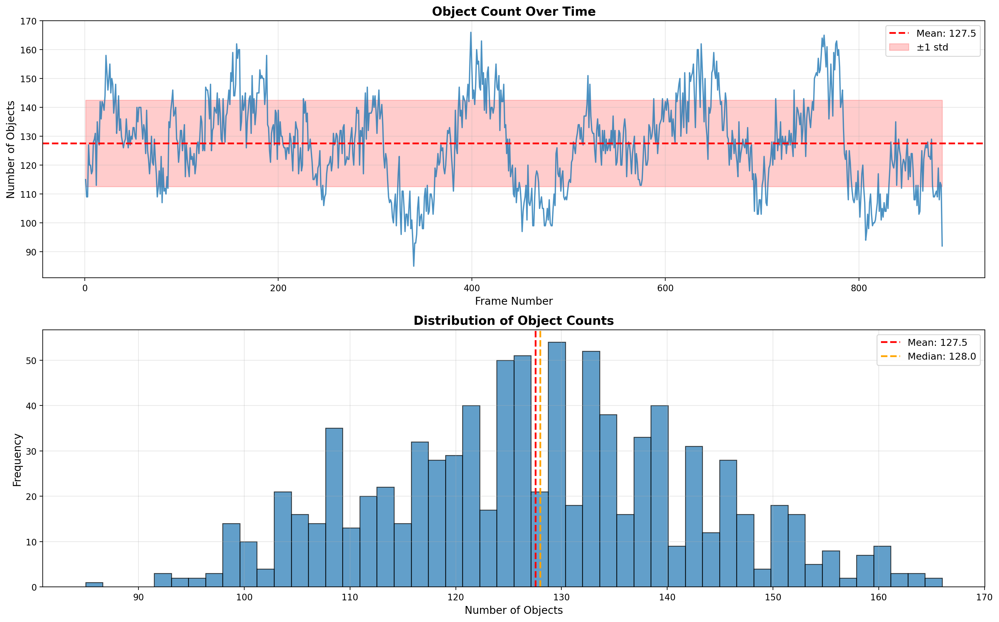

In [7]:
# Plot số objects theo thời gian
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 10))

# Time series
ax1.plot(df['frame_num'], df['n_objects'], linewidth=1.5, alpha=0.8)
ax1.axhline(df['n_objects'].mean(), color='red', linestyle='--', 
            label=f'Mean: {df["n_objects"].mean():.1f}', linewidth=2)
ax1.fill_between(df['frame_num'], 
                  df['n_objects'].mean() - df['n_objects'].std(),
                  df['n_objects'].mean() + df['n_objects'].std(),
                  alpha=0.2, color='red', label='±1 std')
ax1.set_xlabel('Frame Number', fontsize=12)
ax1.set_ylabel('Number of Objects', fontsize=12)
ax1.set_title('Object Count Over Time', fontsize=14, fontweight='bold')
ax1.legend(fontsize=11)
ax1.grid(alpha=0.3)

# Histogram
ax2.hist(df['n_objects'], bins=50, edgecolor='black', alpha=0.7)
ax2.axvline(df['n_objects'].mean(), color='red', linestyle='--', 
            label=f'Mean: {df["n_objects"].mean():.1f}', linewidth=2)
ax2.axvline(df['n_objects'].median(), color='orange', linestyle='--', 
            label=f'Median: {df["n_objects"].median():.1f}', linewidth=2)
ax2.set_xlabel('Number of Objects', fontsize=12)
ax2.set_ylabel('Frequency', fontsize=12)
ax2.set_title('Distribution of Object Counts', fontsize=14, fontweight='bold')
ax2.legend(fontsize=11)
ax2.grid(alpha=0.3)

plt.tight_layout()
plt.savefig(output_dir / 'analysis_plots.png', dpi=150, bbox_inches='tight')
plt.show()

## 6. Xem một số kết quả cụ thể

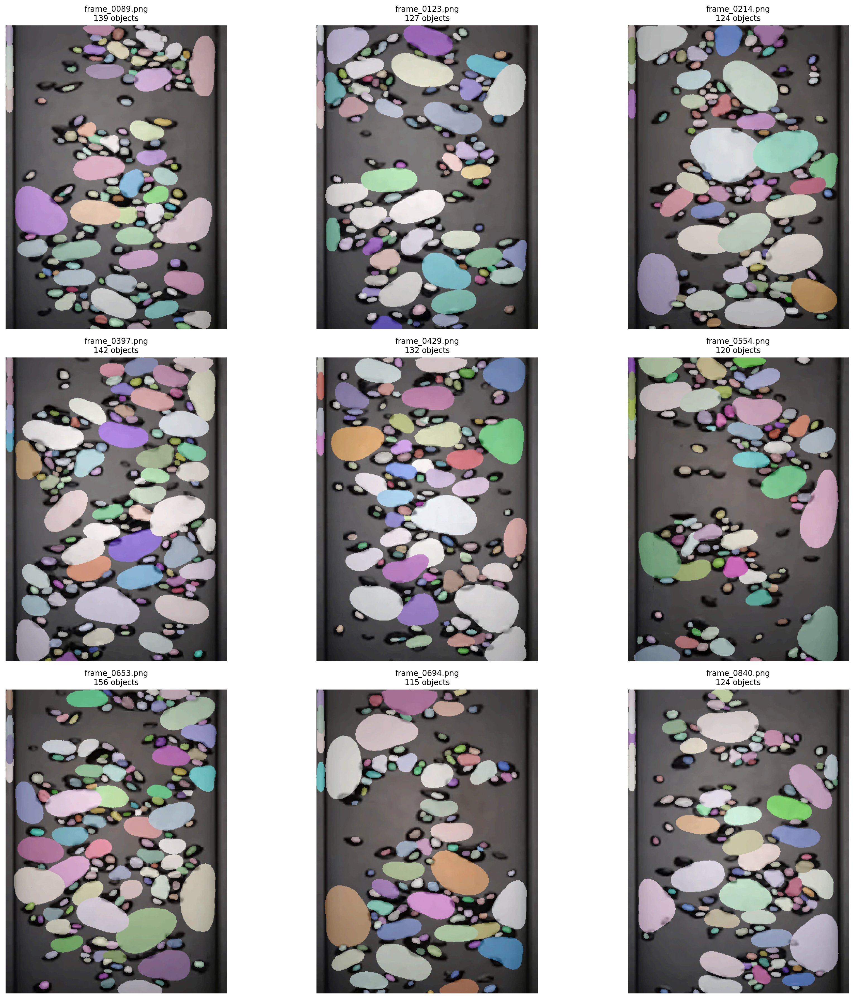

In [8]:
# Xem 9 frames ngẫu nhiên
sample_indices = np.random.choice(len(frame_files), min(9, len(frame_files)), replace=False)
sample_files = [frame_files[i] for i in sorted(sample_indices)]

fig, axes = plt.subplots(3, 3, figsize=(18, 18))

for ax, frame_file in zip(axes.flat, sample_files):
    # Load ảnh và mask
    img = np.array(Image.open(frame_file))
    mask = np.array(Image.open(masks_dir / frame_file.name))
    n_objects = len(np.unique(mask)) - 1
    
    # Hiển thị overlay
    ax.imshow(img, cmap='gray' if img.ndim == 2 else None)
    ax.imshow(mask, cmap=lbl_cmap, alpha=0.5)
    ax.set_title(f"{frame_file.name}\n{n_objects} objects", fontsize=10)
    ax.axis('off')

plt.tight_layout()
plt.savefig(output_dir / 'sample_predictions.png', dpi=150, bbox_inches='tight')
plt.show()

## 7. Export kết quả sang các formats khác

### 7.1 Export sang CSV với tọa độ từng object

In [9]:
from scipy.ndimage import center_of_mass, find_objects

# Export detailed object information
detailed_results = []

print("Extracting object coordinates...")
for i, frame_file in enumerate(tqdm(frame_files[:100], desc="Processing")):
    # Load mask
    mask = np.array(Image.open(masks_dir / frame_file.name))
    frame_num = int(frame_file.stem.split('_')[1])
    
    # Lấy thông tin từng object
    for obj_id in np.unique(mask):
        if obj_id == 0:  # Skip background
            continue
        
        obj_mask = (mask == obj_id)
        
        # Center of mass
        y, x = center_of_mass(obj_mask)
        
        # Bounding box
        obj_slice = find_objects(mask == obj_id)[0]
        y_min, y_max = obj_slice[0].start, obj_slice[0].stop
        x_min, x_max = obj_slice[1].start, obj_slice[1].stop
        
        # Area
        area = obj_mask.sum()
        
        detailed_results.append({
            'frame': frame_file.name,
            'frame_num': frame_num,
            'object_id': obj_id,
            'centroid_x': x,
            'centroid_y': y,
            'bbox_x_min': x_min,
            'bbox_y_min': y_min,
            'bbox_x_max': x_max,
            'bbox_y_max': y_max,
            'area': area
        })

# Lưu vào CSV
df_detailed = pd.DataFrame(detailed_results)
df_detailed.to_csv(output_dir / 'detailed_objects.csv', index=False)
print(f"\n✅ Detailed results saved to: {output_dir / 'detailed_objects.csv'}")
print(f"   Total objects: {len(df_detailed)}")

Extracting object coordinates...


Processing: 100%|██████████| 100/100 [00:37<00:00,  2.68it/s]


✅ Detailed results saved to: predictions\detailed_objects.csv
   Total objects: 13006


### 7.2 Export sang ImageJ ROIs

In [10]:
# Để export sang ImageJ ROIs, bạn cần cài package roifile
try:
    from roifile import ImagejRoi
    from skimage.measure import find_contours
    
    rois_dir = output_dir / 'imagej_rois'
    rois_dir.mkdir(exist_ok=True)
    
    print("Exporting to ImageJ ROIs...")
    print("Note: Chỉ export 10 frames đầu để demo. Xóa [:10] để export tất cả.")
    
    for frame_file in tqdm(frame_files[:10], desc="Exporting ROIs"):
        mask = np.array(Image.open(masks_dir / frame_file.name))
        
        # Tạo thư mục cho frame này
        frame_roi_dir = rois_dir / frame_file.stem
        frame_roi_dir.mkdir(exist_ok=True)
        
        # Export từng object
        for obj_id in np.unique(mask):
            if obj_id == 0:
                continue
            
            obj_mask = (mask == obj_id).astype(np.uint8)
            contours = find_contours(obj_mask, 0.5)
            
            if len(contours) > 0:
                contour = contours[0]
                roi = ImagejRoi.frompoints(contour[:, [1, 0]])
                roi.name = f"Object_{obj_id}"
                roi.tofile(frame_roi_dir / f"roi_{obj_id:04d}.roi")
    
    print(f"\n✅ ImageJ ROIs saved to: {rois_dir}")
    
except ImportError:
    print("⚠️ Package 'roifile' not installed.")
    print("   To export ImageJ ROIs, install: pip install roifile")

⚠️ Package 'roifile' not installed.
   To export ImageJ ROIs, install: pip install roifile


### 7.3 Tạo video visualization

In [11]:
try:
    import cv2
    
    print("Creating video visualization...")
    
    # Lấy kích thước frame
    first_img = np.array(Image.open(frame_files[0]))
    height, width = first_img.shape[:2]
    
    # Tạo video writer
    video_path = str(output_dir / 'predictions_video.mp4')
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    fps = 10  # 10 frames per second
    video = cv2.VideoWriter(video_path, fourcc, fps, (width, height))
    
    # Mỗi 5 frame để video không quá nặng
    for frame_file in tqdm(frame_files[::5], desc="Creating video"):
        # Load ảnh và mask
        img = np.array(Image.open(frame_file))
        mask = np.array(Image.open(masks_dir / frame_file.name))
        
        # Convert sang RGB nếu cần
        if img.ndim == 2:
            img_rgb = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
        else:
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Vẽ contours
        from skimage.segmentation import find_boundaries
        boundaries = find_boundaries(mask, mode='outer')
        img_rgb[boundaries] = [255, 0, 0]  # Red contours
        
        # Add text
        n_objects = len(np.unique(mask)) - 1
        cv2.putText(img_rgb, f"{frame_file.name}: {n_objects} objects", 
                    (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 0), 2)
        
        # Write frame
        video.write(cv2.cvtColor(img_rgb, cv2.COLOR_RGB2BGR))
    
    video.release()
    print(f"\n✅ Video saved to: {video_path}")
    
except ImportError:
    print("⚠️ OpenCV not installed. Cannot create video.")
    print("   To create video, install: pip install opencv-python")

⚠️ OpenCV not installed. Cannot create video.
   To create video, install: pip install opencv-python


## 8. Tóm tắt và kết luận

In [12]:
print("\n" + "="*60)
print("PREDICTION SUMMARY")
print("="*60)

print(f"\n📊 STATISTICS:")
print(f"   Total frames processed: {len(frame_files)}")
print(f"   Total objects detected: {df['n_objects'].sum()}")
print(f"   Average objects per frame: {df['n_objects'].mean():.1f}")

print(f"\n📁 OUTPUT FILES:")
print(f"   Masks: {masks_dir} ({len(list(masks_dir.glob('*')))} files)")
print(f"   Overlays: {overlay_dir} ({len(list(overlay_dir.glob('*')))} files)")
print(f"   Summary CSV: {output_dir / 'detection_results.csv'}")
if (output_dir / 'detailed_objects.csv').exists():
    print(f"   Detailed CSV: {output_dir / 'detailed_objects.csv'}")
if (output_dir / 'predictions_video.mp4').exists():
    print(f"   Video: {output_dir / 'predictions_video.mp4'}")

print(f"\n📈 ANALYSIS PLOTS:")
print(f"   {output_dir / 'analysis_plots.png'}")
print(f"   {output_dir / 'sample_predictions.png'}")

print(f"\n✅ ALL DONE!")
print(f"\n💡 NEXT STEPS:")
print(f"   1. Kiểm tra kết quả trong thư mục '{output_dir}'")
print(f"   2. Xem video và overlays để đánh giá chất lượng")
print(f"   3. Nếu kết quả chưa tốt:")
print(f"      - Điều chỉnh prob_thresh và nms_thresh")
print(f"      - Hoặc train lại với nhiều dữ liệu/tham số khác")
print(f"   4. Sử dụng CSV files cho phân tích thống kê tiếp theo")
print("="*60)


PREDICTION SUMMARY

📊 STATISTICS:
   Total frames processed: 886
   Total objects detected: 113009
   Average objects per frame: 127.5

📁 OUTPUT FILES:
   Masks: predictions\masks (886 files)
   Overlays: predictions\overlays (88 files)
   Summary CSV: predictions\detection_results.csv
   Detailed CSV: predictions\detailed_objects.csv

📈 ANALYSIS PLOTS:
   predictions\analysis_plots.png
   predictions\sample_predictions.png

✅ ALL DONE!

💡 NEXT STEPS:
   1. Kiểm tra kết quả trong thư mục 'predictions'
   2. Xem video và overlays để đánh giá chất lượng
   3. Nếu kết quả chưa tốt:
      - Điều chỉnh prob_thresh và nms_thresh
      - Hoặc train lại với nhiều dữ liệu/tham số khác
   4. Sử dụng CSV files cho phân tích thống kê tiếp theo


---
## 🔧 FINE-TUNING THRESHOLDS (nếu cần)

Nếu kết quả chưa tốt, bạn có thể điều chỉnh thresholds mà không cần train lại:

Testing different thresholds...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.096491225..1.0307018].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.096491225..1.0307018].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.096491225..1.0307018].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.096491225..1.0307018].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.096491225..1.0307018].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.096491225..1.0307018].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got rang

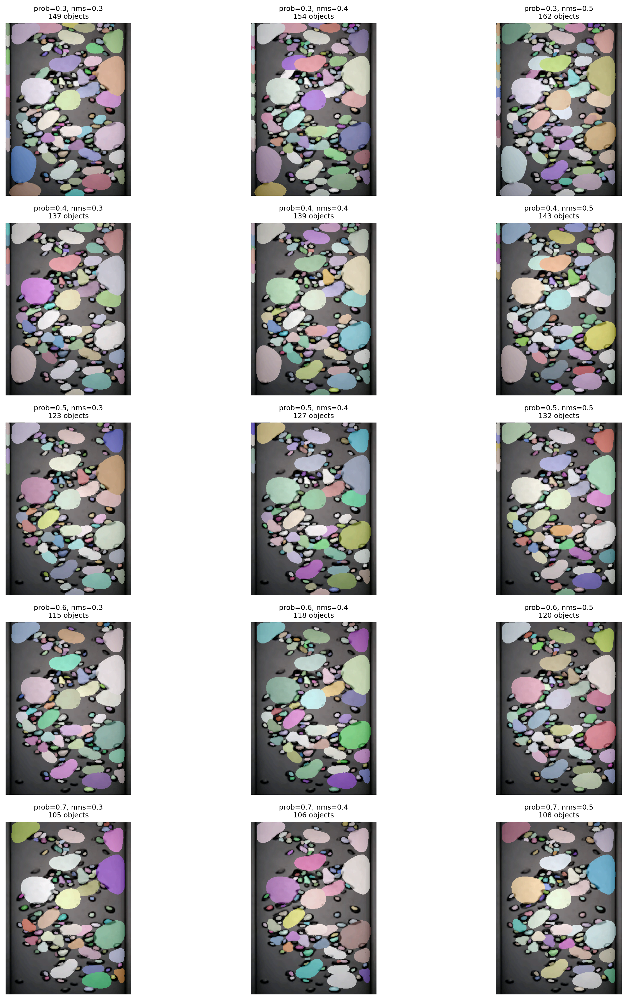


💡 Chọn threshold tốt nhất và update:
   model.thresholds.prob = <giá_trị_tốt_nhất>
   model.thresholds.nms = <giá_trị_tốt_nhất>
   Sau đó chạy lại prediction với threshold mới


In [13]:
# Thử các giá trị thresholds khác nhau
test_frame_idx = 100  # Chọn 1 frame để test
test_frame = frame_files[test_frame_idx]
test_img = normalize(np.array(Image.open(test_frame)), 1, 99.8, axis=(0,1))

# Các threshold để thử
prob_threshs = [0.3, 0.4, 0.5, 0.6, 0.7]
nms_threshs = [0.3, 0.4, 0.5]

fig, axes = plt.subplots(len(prob_threshs), len(nms_threshs), figsize=(15, 18))

print("Testing different thresholds...")
for i, prob_th in enumerate(prob_threshs):
    for j, nms_th in enumerate(nms_threshs):
        labels, _ = model.predict_instances(
            test_img,
            prob_thresh=prob_th,
            nms_thresh=nms_th,
            n_tiles=model._guess_n_tiles(test_img),
            show_tile_progress=False
        )
        
        n_objects = len(np.unique(labels)) - 1
        
        axes[i, j].imshow(test_img, cmap='gray' if test_img.ndim == 2 else None)
        axes[i, j].imshow(labels, cmap=lbl_cmap, alpha=0.5)
        axes[i, j].set_title(f"prob={prob_th}, nms={nms_th}\n{n_objects} objects", fontsize=9)
        axes[i, j].axis('off')

plt.tight_layout()
plt.savefig(output_dir / 'threshold_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"\n💡 Chọn threshold tốt nhất và update:")
print(f"   model.thresholds.prob = <giá_trị_tốt_nhất>")
print(f"   model.thresholds.nms = <giá_trị_tốt_nhất>")
print(f"   Sau đó chạy lại prediction với threshold mới")

## 📝 KẾT LUẬN

Bạn đã hoàn thành toàn bộ quy trình:
1. ✅ Chuẩn bị dữ liệu và gán nhãn
2. ✅ Training model với tham số tối ưu
3. ✅ Predict trên toàn bộ dataset
4. ✅ Export kết quả sang nhiều formats
5. ✅ Phân tích và đánh giá kết quả

### Nếu muốn cải thiện thêm:
- Thêm dữ liệu training với annotations tốt hơn
- Thử transfer learning từ các pretrained models khác
- Tăng n_rays cho objects phức tạp hơn
- Sử dụng ensemble của nhiều models
- Post-processing để refine results